Codes borrrowed from Computation Linear Algebra class notebook taught by Rachel Thomas.  The goal is to remove background from a video using SVD

<img src="images/bgr.png">

In [1]:
import imageio
# imageio.plugins.ffmpeg.download() # uncomment it to download

In [2]:
import moviepy.editor as mpe
import numpy as np
import scipy

%matplotlib inline
import matplotlib.pyplot as plt

In [3]:
np.set_printoptions(precision=4, suppress=True)

In [42]:
# load the video
video = mpe.VideoFileClip("peds.avi")

In [43]:
video = video.subclip(25,75)

In [44]:
video.ipython_display() # show the subclip video

100%|██████████| 1499/1499 [00:04<00:00, 357.79it/s]


In [45]:
video.duration 

50

### Helper functions

In [46]:
def create_data_matrix_from_video(clip, fps=5, scale=50):
    return np.vstack([scipy.misc.imresize(rgb2gray(clip.get_frame(i/float(fps))).astype(int), 
                      scale).flatten() for i in range(fps * int(clip.duration))]).T

In [47]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

### Reformat data into matrix

In [48]:
video.size

(640, 360)

In [49]:
video.fps

29.97002997002997

In [50]:
scale = 0.25   # Adjust scale to change resolution of image
dims = (int(360 * scale), int(640 * scale))
fps = 30     # frames per second

In [51]:
160*90

14400

In [53]:
50*30

1500

An image from 1 moment in time is 160 pixels by 90 pixels (when scaled by 0.25 times). We can *unroll* that picture into a single tall column. So instead of having a 2D picture that is $160 \times 90$, we have a $1 \times 144,00$ column 

This isn't very human-readable, but it's handy because it lets us stack the images from different times on top of one another, to put a video all into 1 matrix.  If we took the video image every 30th of a second for 50 seconds (so 1500 different images, each from a different point in time), we'd have a $1500 \times 144,00$ matrix, representing the video! 

In [54]:
M = create_data_matrix_from_video(video.subclip(), fps, scale)

In [55]:
print(dims, M.shape)

(90, 160) (14400, 1500)


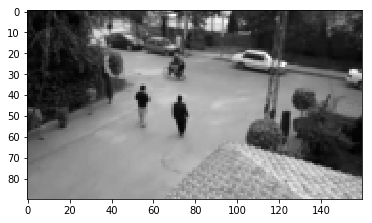

In [87]:
plt.imshow(np.reshape(M[:,1000], dims), cmap='gray'); # 800th frame

In [57]:
np.save("ped_30fps.npy", M)

In [58]:
M.shape

(14400, 1500)

In [59]:
M[::3,:] # 1/3rd of video

array([[ 55,  55,  55, ...,  29,  29,  29],
       [ 48,  48,  48, ...,  28,  28,  28],
       [ 42,  42,  42, ...,  32,  32,  32],
       ...,
       [ 56,  56,  56, ..., 151, 151, 151],
       [ 52,  52,  52, ..., 117, 117, 117],
       [ 55,  55,  55, ..., 159, 159, 159]], dtype=uint8)

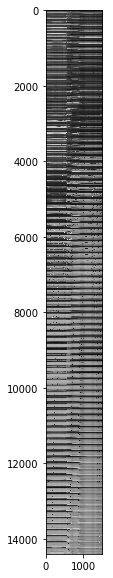

In [60]:
plt.figure(figsize=(20, 10))
plt.imshow(M, cmap='gray')

Wiggly lines in above matrix represent moving objects. The lines which look similar in all vectors represent background

### SVD

In [61]:
U, s, V = np.linalg.svd(M, full_matrices=False) # numpy SVD

In [62]:
np.save("U.npy", U)
np.save("s.npy", s)
np.save("V.npy", V)

In [63]:
U = np.load("U.npy")
s = np.load("s.npy")
V = np.load("V.npy")

In [64]:
U.shape, s.shape, V.shape

((14400, 1500), (1500,), (1500, 1500))

We have 1500 singular values.   
1st vector of U, V and 1st singular value represents dimension with maximum explaination of our matrix. Guess what? Maximum variability of matrix is going to be defined by background 

We choose first 10 singular values and first 10 vectors of U,V. These vectors explain maximum variability of original matrix (non wiggly part as that part is most prevailant in overall matrix). That part represents the background. We use these vectors to reconstruct the low rank matrix of same shape as original matrix. If we use this reconstructed matrix to make the video. That video will only include background. Now we can get remaining foreground by just subracking low rank matrix from original matrix M. 

Choice of how many singular values to use depends on the quality of video

In [71]:
s[0]

523843.67563442467

In [78]:
low_rank = (U[:,0:5] * s[0:5])@V[0:5,:]

In [79]:
low_rank.shape

(14400, 1500)

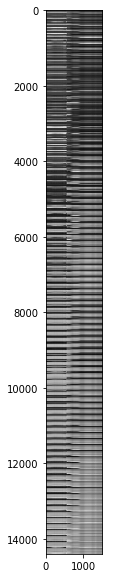

In [80]:
plt.figure(figsize=(10, 10))
plt.imshow(low_rank, cmap='gray')

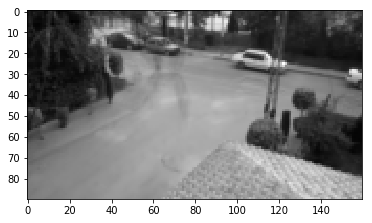

In [88]:
plt.imshow(np.reshape(low_rank[:,1000], dims), cmap='gray');

As we can observe that person is now lost from 650th frame. If we subtract this low rank matrix from M matrix, we will get only foreground. I.e. person walking

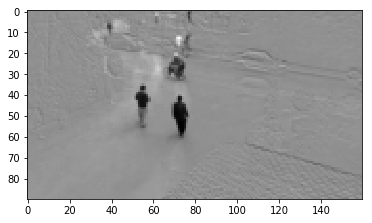

In [89]:
plt.imshow(np.reshape(M[:,1000] - low_rank[:,1000], dims), cmap='gray');

### Video

In [90]:
from moviepy.video.io.bindings import mplfig_to_npimage

In [91]:
def make_video(matrix, dims, filename):
    mat_reshaped = np.reshape(matrix, (dims[0], dims[1], -1))
    
    fig, ax = plt.subplots()
    def make_frame(t):
        ax.clear()
        ax.imshow(mat_reshaped[...,int(t*fps)])
        return mplfig_to_npimage(fig)
    
    animation = mpe.VideoClip(make_frame, duration=int(10))
    animation.write_videofile( filename + '.mp4', fps=fps)

[MoviePy] >>>> Building video ped.mp4
[MoviePy] Writing video ped.mp4


100%|█████████▉| 300/301 [00:26<00:00, 11.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ped.mp4 



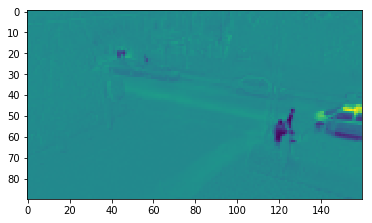

In [93]:
make_video(M - low_rank, dims, "ped")

In [94]:
mpe.VideoFileClip("ped.mp4").subclip().ipython_display()

100%|█████████▉| 300/301 [00:00<00:00, 540.19it/s]


### End